# <font color='lightgreen'>NLP project part 1</font>

# Imports and functions

In [ ]:
import pandas as pd 
import numpy as np
import math
#connect to drive
from google.colab import drive
# datetime
import datetime
# visualisation
import plotly
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
import ipywidgets as widgets
import matplotlib.pyplot as plt 
from wordcloud import WordCloud
#string to list
import ast
#tokanization, pos
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
#stop words 
from nltk.corpus import stopwords
nltk.download('stopwords')
#NER name entity
import spacy
import spacy.cli 
spacy.cli.download("en_core_web_sm")
#remove punct
import re

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [ ]:
# sepaearte numric and categorial features
def get_lists_of_categorial_and_numeric_feature(df,unique_id_col_name="id",label_col_name="label"):
  list_num_cols=list(df.describe().columns.values)
  list_num_cols.remove(unique_id_col_name)
  list_all_cols=list(df.columns.values)
  list_all_cols.remove(label_col_name) # ignoring label for vis purposes
  list_all_cols.remove(unique_id_col_name)
  list_cat_cols=[i for i in list_all_cols if i not in list_num_cols] # categorial cols are all the cols that are not numeric - make sure label is not numeric! date data are relevant as categorial
  return list_cat_cols,list_num_cols

In [ ]:
# Visualisation of categorial features
def vis_label_dist_categorial_features(df,label_col_name,unique_id_col_name,categorial_col_list,numeric_label_col_name):
  
  for col in categorial_col_list:
    print("\n feature name: ",col)
    basic_temp_grouped=df.groupby([col])[unique_id_col_name].count().reset_index(name="count")
    print("number of categories: ",basic_temp_grouped.shape[0])
    if(basic_temp_grouped.shape[0]<120): #if cardenality is low. number of values is lower than 120
      display(basic_temp_grouped)
      fig1 = px.bar(basic_temp_grouped.sort_values(by=[col]), x=col, y="count", color=col, title=col+" distrabution",text_auto=True,color_discrete_sequence=px.colors.qualitative.Pastel)
      fig1.show()

      temp_grouped=df.groupby([col,label_col_name])[unique_id_col_name].count().reset_index(name="count")
      temp_grouped[label_col_name]=temp_grouped[label_col_name].astype(str)
      temp_grouped['percent_label'] = 100 * temp_grouped['count'] / temp_grouped.groupby(col)['count'].transform('sum')

      fig2 = px.bar(temp_grouped, x=col, y="percent_label",title="label split per "+col, color=label_col_name, text=temp_grouped['percent_label'],color_discrete_sequence=px.colors.qualitative.Pastel)
      fig2.update_traces(texttemplate='%{text:.4}%')
      fig2.show()
    else:
      temp_grouped_basic_hist=raw_train.groupby([col])[numeric_label_col_name].agg(['count','mean']).reset_index()
      temp_grouped_basic_hist = temp_grouped_basic_hist.rename({'mean': 'percent_true'}, axis=1)       
      fig88 = px.histogram(temp_grouped_basic_hist, x="percent_true",title='histogram - number of '+col+"per percent of true clicked")
      fig88.add_vline(x=0.067, line_width=3, line_dash="dash", line_color="black",annotation_text="rate across all data")
      fig88.show()
      fig77 = px.histogram(temp_grouped_basic_hist, x="percent_true", y="count", histfunc='sum',title='sum of count of '+col+' per percent of true clicked')
      fig77.add_vline(x=0.067, line_width=3, line_dash="dash", line_color="black",annotation_text="rate across all data")
      fig77.show()

In [ ]:
# aggregate values of categorial feature with high cardenality (any vlaue that appears less than a spesific percent is becoming "other")
def aggregate_other_group_for_high_cardenality_handeling (df,cat_coulmn_name,grouped_col_name,over_percent=0.01):
  new_df=df.copy()
  new_df['percent']=new_df.groupby(cat_coulmn_name)[cat_coulmn_name].transform('size')/new_df.shape[0]
  new_df[grouped_col_name]=new_df[cat_coulmn_name]
  new_df[grouped_col_name].loc[new_df['percent']<over_percent]='other'
  return new_df

In [ ]:
## generate sankey diagram dictionary values
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = px.colors.qualitative.Pastel
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        )
    link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count'],
        )
    return node,link

In [ ]:
#given text tokens and a list - count number of tokens that are in the list
def count_words_from_list(text_tokens,list_of_words):
  count=0
  for w in text_tokens:
    if w in list_of_words:
      count=count+1
  return count

In [ ]:
#get list of the words (ner label) that are name entities
def spacy_large_ner_label(document):
  return [( ent.label_) for ent in sp_sm(document).ents]

In [ ]:
#get list of the words (text) that are name entities
def spacy_large_ner_text(document):
  return [(ent.text.strip()) for ent in sp_sm(document).ents]

In [ ]:
# create wordcloud graph to see the common words per label
def make_wordcloud(words,title):
    cloud = WordCloud(width=1920, height=1080,max_font_size=200, max_words=350, background_color="white").generate(words)
    plt.figure(figsize=(20,20))
    plt.imshow(cloud, interpolation="gaussian")
    plt.axis("off") 
    plt.title(title, fontsize=60)
    plt.show()

In [ ]:
# for each words that's not on the list, lower and remove punctuations
def lower_and_remove_punct_excpet_listed(sentence,list_words_not_to_lower):
  words=sentence.split()
  new_str_lst=[]
  for w in words:
    if w not in list_words_not_to_lower:
      lowered = w.lower()
      clean = re.sub(r'[^\w\s]', '', lowered)
      new_str_lst.append(clean)
    else:
      new_str_lst.append(w)
  new_str=" ".join(new_str_lst)
  return(new_str)

In [ ]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:         
        return None

In [ ]:
def organize_pos_tags(pos_tagged):
  return list(map(lambda x: (x[0], pos_tagger(x[1])), pos_tagged))

In [ ]:
def lemmatize_with_pos(wordnet_tagged):
  lemmatized_sentence = []
  for word, tag in wordnet_tagged:
      if tag is None:
          # if there is no available tag, append the token as is
          lemmatized_sentence.append(word)
      else:       
          # else use the tag to lemmatize the token
          lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
  lemmatized_sentence = " ".join(lemmatized_sentence)
  return lemmatized_sentence

# Load data

In [ ]:
# data is from : https://www.kaggle.com/datasets/therohk/ireland-historical-news?datasetId=30661
drive.mount('/content/drive')
path = "/content/drive/MyDrive/NLP advanced deep learning/project/ireland-news-headlines.csv"
df = pd.read_csv(path)
df=df.rename(columns={'headline_category':'label'})
print("Shape: ",df.shape)
print(df.isna().sum())
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Shape:  (1611495, 3)
publish_date     0
label            0
headline_text    7
dtype: int64


,publish_date,label,headline_text
0,19960102,news,UUP sees possibility of voting Major out
1,19960102,news,Pubs targeted as curbs on smoking are extended
2,19960102,news,Papers reveal secret links with O'Neill cabinet
3,19960102,news,Domestic chaos as Italy takes EU presidency
4,19960102,news,Learning about the star to which we owe life


In [ ]:
df=df.dropna() # dropping na since it's only 7
print("Shape: ",df.shape)

Shape:  (1611488, 3)


In [ ]:
# publish date to dateparts
df['date']=df.publish_date.apply(lambda x:datetime.datetime.strptime(str(x),'%Y%m%d').strftime('%Y-%m-%d'))
df['year']=df.date.apply(lambda x:x.split('-')[0])
df['month']=df.date.apply(lambda x:x.split('-')[1])
df["date"] = pd.to_datetime(df["date"])
df['day_name'] = df['date'].dt.day_name()
df['weekend_vs_midweek']='midweek'
df['weekend_vs_midweek'].loc[(df['day_name']=='Saturday') | (df['day_name']=='Sunday')]='weekend'
df['id'] = df.index

<ipython-input-12-29055d926849>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['weekend_vs_midweek'].loc[(df['day_name']=='Saturday') | (df['day_name']=='Sunday')]='weekend'


# Visualisation

# Visualisation of labels and time fatures

In [ ]:
#create df for visualisation purposes
df_vis=df[['id','label','year','month','day_name','weekend_vs_midweek']]

In [ ]:
#seperate columns type - numeric vs categorial features
list_cat_cols,list_num_cols=get_lists_of_categorial_and_numeric_feature(df_vis)

### Label distrabution

In [ ]:
# aggregate label with "other" label for labels that are less than 1% of the data since the label's list is very long and for better visualisation of the distrabution
df_vis=aggregate_other_group_for_high_cardenality_handeling(df_vis,'label','grouped_label')

grouped=df_vis[['label','id']].groupby(by=["label"], dropna=False).count().reset_index().rename(columns={'id':'count'})
grouped['percent']=grouped['count']/df_vis.shape[0]
print('Unique Headlines Categories: {}'.format(len(grouped.label.unique())))
grouped['label'].loc[grouped['percent']<0.01]='other'

fig = px.bar(grouped.sort_values(by=['count']), x="label", y="count", color="label", text="percent",color_discrete_sequence=px.colors.qualitative.Pastel,title='Label Distrabution')
fig.update_traces(texttemplate='%{text:.3}%')
fig.show()

<ipython-input-6-1b73e561cd22>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df[grouped_col_name].loc[new_df['percent']<over_percent]='other'


Unique Headlines Categories: 103


<ipython-input-14-824e649eac85>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped['label'].loc[grouped['percent']<0.01]='other'


In [ ]:
df_label=df_vis[['id','label']]
# Split labels by "."
df_label[['label_level_1', 'label_level_2', 'label_level_3', 'label_level_4']] = df_label['label'].str.split('.', expand=True)

In [ ]:
# Group by first label and count occurrences
grouped_l1=df_label[['label_level_1','id']].groupby(by=["label_level_1"], dropna=False).count().reset_index().rename(columns={'id':'count'})
grouped_l1['percent']=grouped_l1['count']/df_label.shape[0]
print('Unique Headlines Categories: {}'.format(len(grouped_l1.label_level_1.unique())))

fig = px.bar(grouped_l1.sort_values(by=['count']), x="label_level_1", y="count", color="label_level_1", text="percent",color_discrete_sequence=px.colors.qualitative.Pastel,title='First Label Distrabution')
fig.update_traces(texttemplate='%{text:.3}%')
fig.show()

Unique Headlines Categories: 6


In [ ]:
label_counts=df_label[['label_level_1', 'label_level_2', 'label_level_3', 'label_level_4','id']].groupby(by=["label_level_1", 'label_level_2', 'label_level_3', 'label_level_4'], dropna=False).count().reset_index().rename(columns={'id':'count'})


In [ ]:
# present all labels count
label_counts = label_counts.replace({np.nan: None})
label_counts.sort_values(by=['count'],ascending=False).head(105)

,label_level_1,label_level_2,label_level_3,label_level_4,count
92,news,None,None,None,580238
102,sport,None,None,None,158682
24,business,None,None,None,111435
94,opinion,letters,None,None,79276
95,opinion,None,None,None,49946
...,...,...,...,...,...
45,lifestyle,food,restaurant,None,203
84,news,technology,None,None,191
15,business,markets,bonds,None,127
39,lifestyle,abroad,working-abroad,None,116


In [ ]:
# get sankey dictionary values and visualize all labels hirarchy
node,link=genSankey(label_counts,cat_cols=['label_level_1', 'label_level_2', 'label_level_3', 'label_level_4'],value_cols='count',title='Sankey Diagram')

In [ ]:
fig = go.Figure(data=[go.Sankey(
    node = node,
    link = link)])

fig.update_layout(title_text="Sankey Diagram for labels hierarchy", font_size=14,width=1000,
    height=1500)
fig.add_annotation(dict(font=dict(color='black',size=15),
                                        x=0,
                                        y=0,
                                        showarrow=False,
                                        text="blue - first label, yellow - second label, orange - third label, purple - fourth label",
                                        xanchor='left',
                                        xref="paper",
                                        yref="paper"))
fig.show()

some conclusion: label distrabution is very long tail, organised as hierarchy labels with up to 4 levels (onlt for new main label)

### Time feature

In [ ]:
#visualisation for all time (categorial) features - for each feature, present the feature distrabution on bar charts and the label distrbution across each value
vis_label_dist_categorial_features(df_vis,'grouped_label','id',list_cat_cols,list_num_cols)


 feature name:  year
number of categories:  26


,year,count
0,1996,54744
1,1997,55340
2,1998,54593
3,1999,63515
4,2000,59273
5,2001,76639
6,2002,57052
7,2003,62132
8,2004,62405
9,2005,60520



 feature name:  month
number of categories:  12


,month,count
0,01,137323
1,02,134351
2,03,140700
3,04,130489
4,05,144307
5,06,136603
6,07,133011
7,08,126814
8,09,133163
9,10,141028



 feature name:  day_name
number of categories:  7


,day_name,count
0,Friday,278724
1,Monday,235502
2,Saturday,265326
3,Sunday,46946
4,Thursday,265329
5,Tuesday,259015
6,Wednesday,260646



 feature name:  weekend_vs_midweek
number of categories:  2


,weekend_vs_midweek,count
0,midweek,1299216
1,weekend,312272


some conclusions:
* "news" label is decreasing across the years, from 2013, most labels are from "other" meaning the long tail labels.
* month has no effect on label - same distrabution of labels across all months
* there are less news on Sundays, Sundays has more sport.soccer label than the other days while Monday has more sport label thatn other days.
* midweek vs weekend also has some differances for the label distrabution


## Stop words visualization

In [ ]:
df=df[['id','headline_text','label']]

In [ ]:
df["headline_text"] = df["headline_text"].apply(lambda x: str(x))
df['tokenized'] = df['headline_text'].str.lower().apply(nltk.word_tokenize)

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')
df['stop_words_count'] = df.tokenized.apply(lambda x: count_words_from_list(x,stopwords))
df['count_of_words']=df.tokenized.apply(lambda x: len(x))
df_sw=aggregate_other_group_for_high_cardenality_handeling(df,'label','grouped_label')

<ipython-input-15-1b73e561cd22>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df[grouped_col_name].loc[new_df['percent']<over_percent]='other'


In [ ]:
#visulisation for the perecent of stop words per common labels, presented as global hover include count of words
grouped_sw=df_sw[['grouped_label','stop_words_count','count_of_words']].groupby(by=["grouped_label"], dropna=False).sum().reset_index()
grouped_sw['percent_of_stop_words']=grouped_sw['stop_words_count']/grouped_sw['count_of_words']

fig = px.bar(grouped_sw.sort_values(by=['percent_of_stop_words']), x="grouped_label", y="percent_of_stop_words", hover_data=['stop_words_count','count_of_words'],text="percent_of_stop_words",color_discrete_sequence=px.colors.qualitative.Pastel,title='Percent of stop words per category')
fig.update_traces(texttemplate='%{text:.3}%')
fig.show()

In [ ]:
#visulisation for the perecent of stop words per common labels, presented as average hover include count of words
df_sw['percent_of_stop_words']=df_sw['stop_words_count']/df_sw['count_of_words']
grouped_sw=df_sw[['grouped_label','stop_words_count','count_of_words','percent_of_stop_words']].groupby(by=["grouped_label"], dropna=False).mean().reset_index()

fig = px.bar(grouped_sw.sort_values(by=['percent_of_stop_words']), x="grouped_label", y="percent_of_stop_words", hover_data=['stop_words_count','count_of_words'],text="percent_of_stop_words",color_discrete_sequence=px.colors.qualitative.Pastel,title='AVG Percent of stop words per category')
fig.update_traces(texttemplate='%{text:.3}%')
fig.show()

As the the headlines are short sentances with ~7 words and the stop words are ~ 25% of it we decided not to remove stop words as part of the pre-processing in order to not loss important information.

## Name entities

In [ ]:
list_of_name_entites=['ORG', 'CARDINAL', 'DATE', 'GPE', 'PERSON', 'MONEY', 'PRODUCT', 'TIME', 'PERCENT', 'WORK_OF_ART', 'QUANTITY', 'NORP', 'LOC', 'EVENT', 'ORDINAL', 'FAC', 'LAW', 'LANGUAGE']


In [ ]:
sp_sm = spacy.load('en_core_web_sm')
# add ner entity label and text 
df['ner']=df.headline_text.apply(lambda x:spacy_large_ner_label(x))
df['ner_text']=df.headline_text.apply(lambda x:spacy_large_ner_text(x))

In [ ]:
df['count_of_ners']=df.ner.apply(lambda x: len(x))
df['has_ner']='True'
df.loc[df['count_of_ners']==0]='False'

In [ ]:
# pie chart distrabution of headlines with at least one name entity
fig = px.pie(df, names='has_ner',color_discrete_sequence=[ 'salmon', 'navy'],title='Percent of headlines with at least one name entity') # Setting Heart_ stroke as the label
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [ ]:
ne_exploded=df.explode('ner') #duplicate rows per each ner per row ( a row with ['ORG','PERSON'] would split into 2 rows)
clean_ne_eploded=ne_exploded.loc[ne_exploded['label']!='False']
grouped_ne=clean_ne_eploded[['label','ner','count_of_ners']].groupby(by=["label","ner"], dropna=False).count().reset_index()
grouped_ne['Percentage']=100 * grouped_ne['count_of_ners'] / grouped_ne.groupby('label')['count_of_ners'].transform('sum')
grouped_ne.head(100)
#how many
fig = px.bar(grouped_ne, x="label", y="Percentage",color='ner',text='Percentage',color_discrete_sequence=px.colors.qualitative.Pastel,title='Percent of ner per label (all labels) and ner type')
fig.update_traces(texttemplate='%{text:.4}%')
fig.show()


In [ ]:
df_ner=aggregate_other_group_for_high_cardenality_handeling(df,'label','grouped_label')

<ipython-input-40-1b73e561cd22>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
ne_exploded2=df_ner.explode('ner') #duplicate rows per each ner per row ( a row with ['ORG','PERSON'] would split into 2 rows)
clean_ne_eploded=ne_exploded2.loc[ne_exploded2['grouped_label']!='False']
grouped_ne=clean_ne_eploded[['grouped_label','ner','count_of_ners']].groupby(by=["grouped_label","ner"], dropna=False).count().reset_index()
grouped_ne['Percentage']=100 * grouped_ne['count_of_ners'] / grouped_ne.groupby('grouped_label')['count_of_ners'].transform('sum')
grouped_ne.head(100)
#how many
fig = px.bar(grouped_ne, x="grouped_label", y="Percentage",color='ner',text='Percentage',color_discrete_sequence=px.colors.qualitative.Pastel,title='Percent of ner per label (top labels in count) and ner type')
fig.update_traces(texttemplate='%{text:.4}%')
fig.show()

In [ ]:
# explanation of the entites types
for entity in list_of_name_entites:
  print(entity,":",spacy.explain(entity))

ORG : Companies, agencies, institutions, etc.
CARDINAL : Numerals that do not fall under another type
DATE : Absolute or relative dates or periods
GPE : Countries, cities, states
PERSON : People, including fictional
MONEY : Monetary values, including unit
PRODUCT : Objects, vehicles, foods, etc. (not services)
TIME : Times smaller than a day
PERCENT : Percentage, including "%"
WORK_OF_ART : Titles of books, songs, etc.
QUANTITY : Measurements, as of weight or distance
NORP : Nationalities or religious or political groups
LOC : Non-GPE locations, mountain ranges, bodies of water
EVENT : Named hurricanes, battles, wars, sports events, etc.
ORDINAL : "first", "second", etc.
FAC : Buildings, airports, highways, bridges, etc.
LAW : Named documents made into laws.
LANGUAGE : Any named language


In [ ]:
ne_text_exploded=df_ner.explode('ner_text') #duplicate rows per each ner per row ( a row with ['ORG','PERSON'] would split into 2 rows)
ne_text_exploded=aggregate_other_group_for_high_cardenality_handeling(ne_text_exploded,'ner_text','grouped_ner_text',0.001)
clean_ne_text_exploded=ne_text_exploded.loc[ne_text_exploded['grouped_label']!='False']

grouped_ne=clean_ne_text_exploded[['grouped_label','grouped_ner_text','count_of_ners']].groupby(by=["grouped_label","grouped_ner_text"], dropna=False).count().reset_index()
grouped_ne['Percentage']=100 * grouped_ne['count_of_ners'] / grouped_ne.groupby('grouped_label')['count_of_ners'].transform('sum')
grouped_ne.head(100)
#how many
fig = px.bar(grouped_ne, x="grouped_label", y="Percentage",color='grouped_ner_text',text='Percentage',color_discrete_sequence=px.colors.qualitative.Pastel,title='Percent of ner per label (top labels in count) and ner type')
fig.update_traces(texttemplate='%{text:.4}%')
fig.show()

<ipython-input-40-1b73e561cd22>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
#noticing there's a lot of headlines of opnion label with the exact text: AN IRISHMAN'S DIARY, no other label to this text
print("There are ",df.loc[(df['label']=='opinion') & (df['headline_text']=="AN IRISHMAN'S DIARY")].shape[0]," rows with the header -AN IRISHMAN'S DIARY- and the label opinion")
print("There are ",df.loc[(df['label']!='opinion') & (df['headline_text']=="AN IRISHMAN'S DIARY")].shape[0]," rows with the header -AN IRISHMAN'S DIARY- and the label is not opinion")


There are  402  rows with the header -AN IRISHMAN'S DIARY- and the label opinion
There are  0  rows with the header -AN IRISHMAN'S DIARY- and the label is not opinion


With ~70% of our data including name entitiy it's important to adress those in the pre-processing, we decided to not lower those and not remove thier punctuations in order to keep thier context.
The distrabution of the NERS is also different between the different labels but it's in high cardinality, some of it is very expect - for example more "person" NER in politics, culture and specific sport labels

## Common words per label

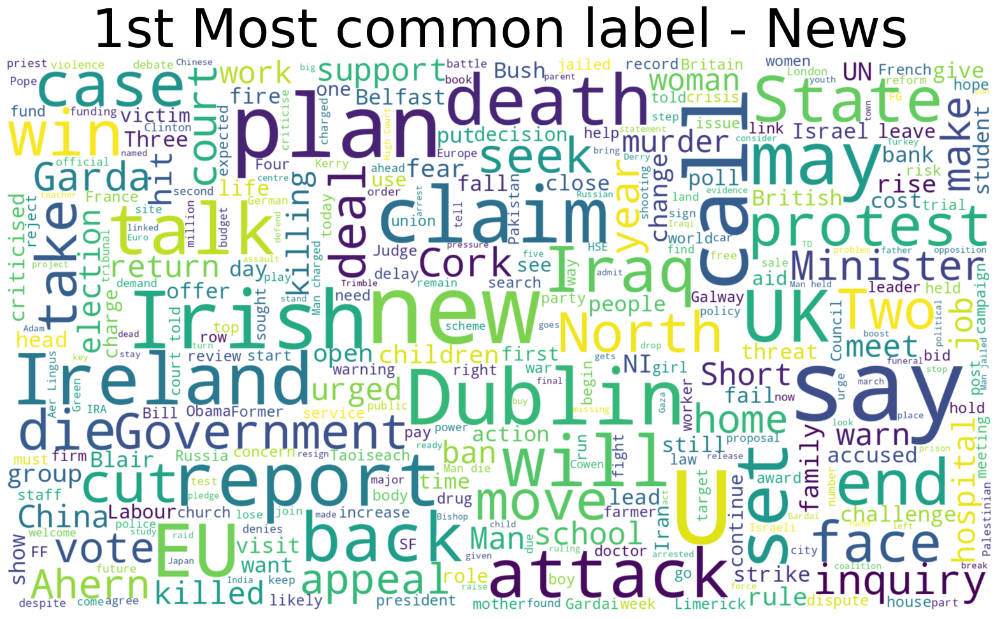

In [ ]:
# 1st Most common label
all_news_text = " ".join(df[df.label == "news"].headline_text) 
make_wordcloud(all_news_text, "1st Most common label - News")

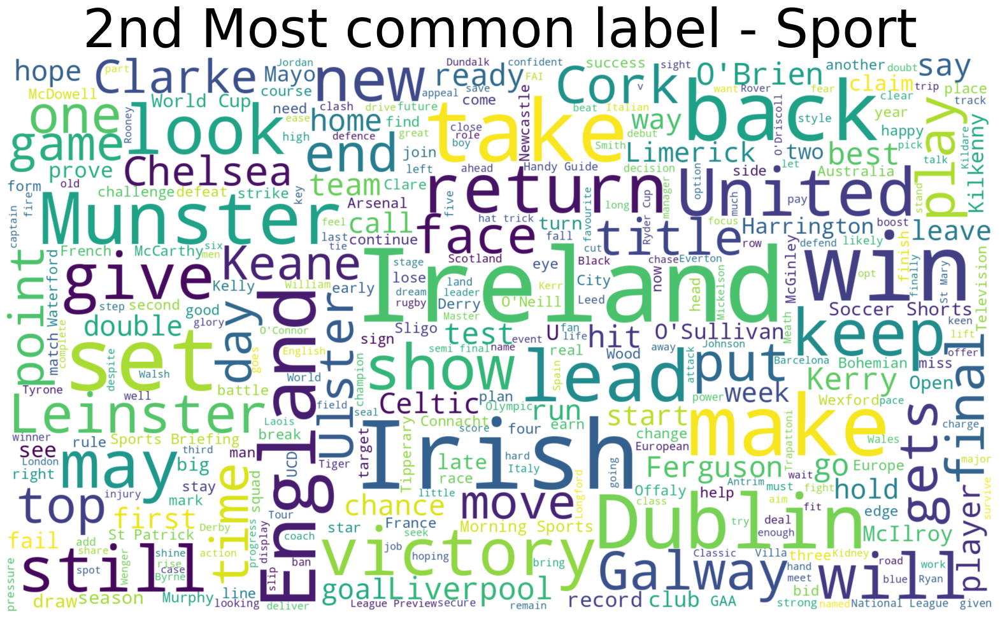

In [ ]:
# 2nd Most common label
all_news_text = " ".join(df[df.label == "sport"].headline_text) 
make_wordcloud(all_news_text, "2nd Most common label - Sport")

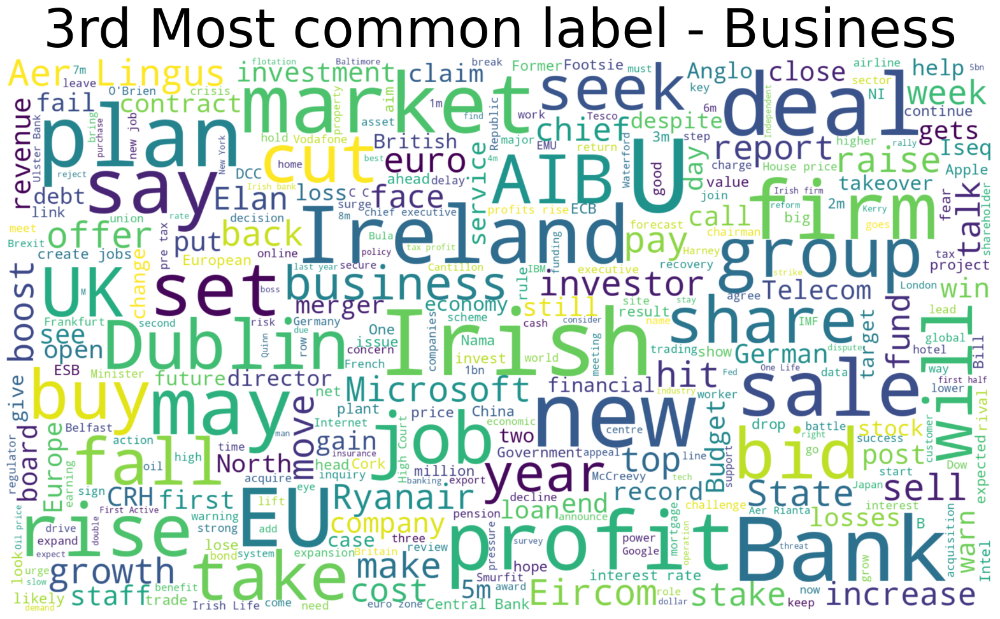

In [ ]:
# 3rd Most common label
all_news_text = " ".join(df[df.label == "business"].headline_text) 
make_wordcloud(all_news_text, "3rd Most common label - Business")

# Pre-proccessing

In [ ]:
df.head()

,id,headline_text,label,tokenized,stop_words_count,count_of_words,ner,ner_text
2,2,Papers reveal secret links with O'Neill cabinet,news,"['papers', 'reveal', 'secret', 'links', 'with'...",1,7,[ORG],[O'Neill]
3,3,Domestic chaos as Italy takes EU presidency,news,"['domestic', 'chaos', 'as', 'italy', 'takes', ...",1,7,"[GPE, ORG]","[Italy, EU]"
5,5,EU proposal for 'skills cards' to detail educa...,news,"['eu', 'proposal', 'for', ""'skills"", 'cards', ...",2,9,[ORG],[EU]
7,7,UCD cancels intake into evening course,news,"['ucd', 'cancels', 'intake', 'into', 'evening'...",1,6,"[GPE, TIME]","[UCD, evening]"
8,8,When days are seconds longer,news,"['when', 'days', 'are', 'seconds', 'longer']",2,5,[DATE],[days]


## Lower all leters and remove punctuations(except name entity)

In [ ]:
df['clean_headline_text']=df.apply(lambda x: lower_and_remove_punct_excpet_listed(x['headline_text'],x['ner_text']),axis=1)
df.head()

,id,headline_text,label,tokenized,stop_words_count,count_of_words,ner,ner_text,clean_headline_text
2,2,Papers reveal secret links with O'Neill cabinet,news,"['papers', 'reveal', 'secret', 'links', 'with'...",1,7,[ORG],[O'Neill],papers reveal secret links with O'Neill cabinet
3,3,Domestic chaos as Italy takes EU presidency,news,"['domestic', 'chaos', 'as', 'italy', 'takes', ...",1,7,"[GPE, ORG]","[Italy, EU]",domestic chaos as Italy takes EU presidency
5,5,EU proposal for 'skills cards' to detail educa...,news,"['eu', 'proposal', 'for', ""'skills"", 'cards', ...",2,9,[ORG],[EU],EU proposal for skills cards to detail education
7,7,UCD cancels intake into evening course,news,"['ucd', 'cancels', 'intake', 'into', 'evening'...",1,6,"[GPE, TIME]","[UCD, evening]",UCD cancels intake into evening course
8,8,When days are seconds longer,news,"['when', 'days', 'are', 'seconds', 'longer']",2,5,[DATE],[days],when days are seconds longer


## Lemmatization with context (pos)

In [ ]:
df['tokenized'] = df['clean_headline_text'].apply(nltk.word_tokenize)

In [ ]:
df.head()

,id,headline_text,label,tokenized,stop_words_count,count_of_words,ner,ner_text,clean_headline_text
2,2,Papers reveal secret links with O'Neill cabinet,news,"[papers, reveal, secret, links, with, O'Neill,...",1,7,[ORG],[O'Neill],papers reveal secret links with O'Neill cabinet
3,3,Domestic chaos as Italy takes EU presidency,news,"[domestic, chaos, as, Italy, takes, EU, presid...",1,7,"[GPE, ORG]","[Italy, EU]",domestic chaos as Italy takes EU presidency
5,5,EU proposal for 'skills cards' to detail educa...,news,"[EU, proposal, for, skills, cards, to, detail,...",2,9,[ORG],[EU],EU proposal for skills cards to detail education
7,7,UCD cancels intake into evening course,news,"[UCD, cancels, intake, into, evening, course]",1,6,"[GPE, TIME]","[UCD, evening]",UCD cancels intake into evening course
8,8,When days are seconds longer,news,"[when, days, are, seconds, longer]",2,5,[DATE],[days],when days are seconds longer


In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet
nltk.download('wordnet')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
lemmatizer = WordNetLemmatizer()

In [ ]:
# get Part-of-speech 
df['pos_tag'] = df['tokenized'].apply(nltk.pos_tag)

In [ ]:
df.head()

,id,headline_text,label,tokenized,stop_words_count,count_of_words,ner,ner_text,clean_headline_text,pos_tag
2,2,Papers reveal secret links with O'Neill cabinet,news,"[papers, reveal, secret, links, with, O'Neill,...",1,7,[ORG],[O'Neill],papers reveal secret links with O'Neill cabinet,"[(papers, NNS), (reveal, VBP), (secret, JJ), (..."
3,3,Domestic chaos as Italy takes EU presidency,news,"[domestic, chaos, as, Italy, takes, EU, presid...",1,7,"[GPE, ORG]","[Italy, EU]",domestic chaos as Italy takes EU presidency,"[(domestic, JJ), (chaos, NN), (as, IN), (Italy..."
5,5,EU proposal for 'skills cards' to detail educa...,news,"[EU, proposal, for, skills, cards, to, detail,...",2,9,[ORG],[EU],EU proposal for skills cards to detail education,"[(EU, NNP), (proposal, NN), (for, IN), (skills..."
7,7,UCD cancels intake into evening course,news,"[UCD, cancels, intake, into, evening, course]",1,6,"[GPE, TIME]","[UCD, evening]",UCD cancels intake into evening course,"[(UCD, NNP), (cancels, NNS), (intake, VBP), (i..."
8,8,When days are seconds longer,news,"[when, days, are, seconds, longer]",2,5,[DATE],[days],when days are seconds longer,"[(when, WRB), (days, NNS), (are, VBP), (second..."


In [ ]:
#lematize
df['wordnet_tagged']=df['pos_tag'].apply(lambda x: organize_pos_tags(x))
df['clean_lemmatized_headlines']=df['wordnet_tagged'].apply(lambda x : lemmatize_with_pos(x))

In [ ]:
df['tokenized'] = df['clean_lemmatized_headlines'].apply(nltk.word_tokenize) # tokenize

In [ ]:
df_to_export=df[['clean_lemmatized_headlines','headline_text','tokenized','label']]

## Export to csv for model

In [ ]:
df_to_export.to_csv('clean_df_for_modeling.csv')
!cp clean_df_for_modeling.csv "/content/drive/MyDrive/advanced deep learning/project/clean_df_for_modeling.csv"